## Installs

In [1]:
%%writefile downloads.sh
pip uninstall kaggle -y
pip install kaggle -q
pip install -U albumentations -q
pip install -U git+https://github.com/lessw2020/Ranger-Deep-Learning-Optimizer -q
pip install -U git+https://github.com/rwightman/efficientdet-pytorch -q
pip install -U git+https://github.com/rwightman/pytorch-image-models -q
pip install --upgrade omegaconf -q
pip install neptune-client -q
mkdir ~/.kaggle/
cp ./kaggle.json ~/.kaggle/kaggle.json
chmod 600 ~/.kaggle/kaggle.json
kaggle competitions download global-wheat-detection
mkdir ./data/
mv global-wheat-detection.zip ./data/global-wheat-detection.zip
unzip ./data/global-wheat-detection.zip -d ./data/
rm ./data/global-wheat-detection.zip

Writing downloads.sh


In [ ]:
# !sh downloads.sh

## Setup


In [3]:
import os
import time
import datetime
import gc
import random
import numpy as np
import pandas as pd
import numba
from numba import jit
from typing import List, Union, Tuple

import cv2
import re
from tqdm import tqdm
from matplotlib import pyplot as plt
from PIL import Image

import torch
import torchvision
from torch.optim import SGD, AdamW, lr_scheduler
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
from torch.cuda.amp import GradScaler


from effdet import (
    get_efficientdet_config, EfficientDet, 
    create_model, create_model_from_config, 
    DetBenchTrain, DetBenchPredict
)
from effdet.efficientdet import HeadNet
from ranger import Ranger
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

import neptune

def seed_everything(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(43)

DIR_INPUT = './data'
DIR_TRAIN = f'{DIR_INPUT}/train'
DIR_TEST = f'{DIR_INPUT}/test'

!nvidia-smi

Sun Jul 12 03:24:06 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.36.06    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
from getpass import getpass
from google.colab import auth
from google.cloud import storage

#NEPTUNE_API_TOKEN = getpass(prompt='Enter neptune api token: ')
#project_id = getpass(prompt='enter gcs project id: ')
#bucket_name = getpass(prompt='enter gcs bucketname: ')

if NEPTUNE_API_TOKEN != '':
    os.environ['NEPTUNE_API_TOKEN'] = NEPTUNE_API_TOKEN
    log = True

auth.authenticate_user()
project_id = 'utsav-37'

def upload_blob(source_file_name, destination_blob_name, bucket_name='utsav-data', PROJECT_ID='utsav-37'):
    """Uploads a file to the bucket."""
    storage_client = storage.Client(project=PROJECT_ID)
    bucket = storage_client.bucket(bucket_name)
    dt_now = datetime.datetime.now().strftime("%d_%B")
    destination_blob_name = 'global-wheat-detection/'+dt_now+'/'+destination_blob_name
    blob = bucket.blob(destination_blob_name)
    blob.upload_from_filename(source_file_name)
    print("File {} uploaded to {}.".format(source_file_name, destination_blob_name))
    print('uploaded blob name: ', destination_blob_name)
    

In [5]:
!gcloud config set project {project_id}

Updated property [core/project].


To take a quick anonymous survey, run:
  $ gcloud survey



In [6]:
train_df = pd.read_csv(f'{DIR_INPUT}/train.csv')

train_df['x'] = -1
train_df['y'] = -1
train_df['w'] = -1
train_df['h'] = -1

def expand_bbox(x):
    r = np.array(re.findall("([0-9]+[.]?[0-9]*)", x))
    if len(r) == 0:
        r = [-1, -1, -1, -1]
    return r

train_df[['x', 'y', 'w', 'h']] = np.stack(train_df['bbox'].apply(lambda x: expand_bbox(x)))
train_df.drop(columns=['bbox'], inplace=True)
train_df['x'] = train_df['x'].astype(np.float)
train_df['y'] = train_df['y'].astype(np.float)
train_df['w'] = train_df['w'].astype(np.float)
train_df['h'] = train_df['h'].astype(np.float)
train_df['area'] = (train_df['w'] * train_df['h'])/(1024*1024)

mapping = {'arvalis_1': 0, 'arvalis_2': 1, 'arvalis_3': 2, 'ethz_1': 3, 'inrae_1': 4, 'rres_1': 5, 'usask_1': 6}

def unique_count(df):
    for k in mapping:
        if len(df[df['source'] == k]['image_id'].unique()) > 0:
            print('unique images from '+k+' fold '+ str(mapping[k]) + ' ' + str(len(df[df['source'] == k]['image_id'].unique())))

print('combined:')
unique_count(train_df)
print()
train_df['folds'] = train_df.replace({'source': mapping}).source.values
df_train = train_df.copy() # copy
valid_df = train_df[train_df['folds'].isin([1, 2, 4, 6])]   
train_df = train_df[train_df['folds'].isin([0, 3, 5])]      
# Next valid: 1, 2, 5    (leaky) | 4, 5, 6   | 0, 4          (leaky) |  
# Next train: 0, 3, 4, 6 (leaky) | 0, 1, 2, 3| 1, 2, 3, 5, 6 (leaky) |
print('train: ')
unique_count(train_df)
print('valid: ')
unique_count(valid_df)
print()
print('No. of train images', len(train_df['image_id'].unique()))
print('No. of test images', len(valid_df['image_id'].unique()))
print('split percent: ', len(valid_df['image_id'].unique())/(len(train_df['image_id'].unique())+len(valid_df['image_id'].unique())))


combined:
unique images from arvalis_1 fold 0 1055
unique images from arvalis_2 fold 1 204
unique images from arvalis_3 fold 2 559
unique images from ethz_1 fold 3 747
unique images from inrae_1 fold 4 176
unique images from rres_1 fold 5 432
unique images from usask_1 fold 6 200

train: 
unique images from arvalis_1 fold 0 1055
unique images from ethz_1 fold 3 747
unique images from rres_1 fold 5 432
valid: 
unique images from arvalis_2 fold 1 204
unique images from arvalis_3 fold 2 559
unique images from inrae_1 fold 4 176
unique images from usask_1 fold 6 200

No. of train images 2234
No. of test images 1139
split percent:  0.33768158908983104


## Dataset

In [328]:
class WheatDataset(Dataset):

    def __init__(self, dataframe, image_dir, isValid=True, transforms=None):
        super().__init__()

        self.image_ids = dataframe['image_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
        self.isValid = isValid

    def __len__(self) -> int:
        return self.image_ids.shape[0]
    
    def __getitem__(self, index: int):
        if self.isValid:
            image, boxes, image_id = self.load_image(index)
        else:
            rng = np.random.random()
            if rng < 0.33:
                image, boxes, image_id = self.load_image(index)
            elif 0.33 < rng < 0.66:
                image, boxes, image_id = self.load_image(index)
                image, boxes = self.cutmix(image, boxes)
            else:
                image, boxes = self.load_mosaic(index)
                image_id = 'mosaic'

        target = {}
        target['bbox'] = boxes
        target['img_id'] = torch.tensor([index])
        target['cls'] = torch.ones((boxes.shape[0],), dtype=torch.int64)
        if self.transforms:
            for i in range(10):
                sample = self.transforms(**{
                    'image': image,
                    'bboxes': target['bbox'],
                    'labels': target['cls']
                })
                if len(sample['bboxes']) > 0:
                    image = sample['image']
                    #target['bbox'] = torch.as_tensor(sample['bboxes'])
                    target['bbox'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)
                    target['bbox'][:,[0,1,2,3]] = target['bbox'][:,[1,0,3,2]]  #yxyx
                    target['cls'] = torch.stack(sample['labels'])
                    break

        target['img_size'] = (IMG_SIZE, IMG_SIZE)

        return image, target, image_id

    def load_image(self, index):
        image_id = self.image_ids[index]
        records = self.df[self.df['image_id'] == image_id]
        image = cv2.imread(f'{self.image_dir}/{image_id}.jpg', cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.uint8)
        boxes = records[['x', 'y', 'w', 'h']].values.astype(np.float32)
        boxes[:, 2] = boxes[:, 0] + boxes[:, 2] 
        boxes[:, 3] = boxes[:, 1] + boxes[:, 3]
        return image, boxes, image_id
    
    def cutmix(self, image_1, boxes_1):
        '''cutmix augmentation'''
        rand_index = self.get_rand_index()
        image_2, boxes_2, _ = self.load_image(rand_index)
        imsize = image_1.shape[0]
        
        #create two random points
        x1, y1 = [int(random.uniform(imsize * 0.1, imsize * 0.4)) for _ in range(2)]
        x2, y2 = [int(random.uniform(imsize * 0.6, imsize * 0.9)) for _ in range(2)]
        
        #clip the random image
        mixup_image = image_1.copy()
        mixup_target = boxes_2
        mixup_target[:, [0, 2]] = mixup_target[:, [0, 2]].clip(min=x1, max=x2)
        mixup_target[:, [1, 3]] = mixup_target[:, [1, 3]].clip(min=y1, max=y2)
        
        #remove cutout bboxes from first image
        boxes_1 = np.delete(boxes_1, np.where(
            ((boxes_1[:,0] > x1) & (boxes_1[:,2] < x2))
            & ((boxes_1[:,1] > y1) & (boxes_1[:,3] < y2))
        ), 0)

        #remove boxes with low visibility (<0.33 inside cutout)
        cutout_ords = np.array([x1, y1, x2, y2])
        boxes_1 = filter_boxes(boxes_1, cutout_ords, reverse=True, thresh=0.33)
        boxes_1 = boxes_1[np.where(
            (boxes_1[:,2]-boxes_1[:,0])
            * (boxes_1[:,3]-boxes_1[:,1]) > 64
        )]

        #remove any bbox with area less than 64
        mixup_target = mixup_target.astype(np.int32)
        mixup_target = mixup_target[np.where(
            (mixup_target[:,2]-mixup_target[:,0])
            * (mixup_target[:,3]-mixup_target[:,1]) > 64
        )]
        
        #mixup
        mixup_target = np.concatenate((boxes_1, mixup_target))
        mixup_image[y1:y2, x1:x2] = (image_2[y1:y2, x1:x2])
        
        return mixup_image, mixup_target

    def cutout(self, image_1, boxes_1):
        '''cutout augmentations'''
        h, w = image_1.shape[:2]
        # create random masks with random number of items
        scale_lim = random.randint(3, 6)
        scales_stacked = [[0.5/(2**x)] * (2**x) for x in range(0, scale_lim, 1)]
        scales = [item for sublist in scales_stacked for item in sublist]
        for s in scales:
            mask_h = random.randint(1, int(h * s))
            mask_w = random.randint(1, int(w * s))
            # cutout box
            xmin = max(0, random.randint(0, w) - mask_w // 2)
            ymin = max(0, random.randint(0, h) - mask_h // 2)
            xmax = min(w, xmin + mask_w)
            ymax = min(h, ymin + mask_h)
            # apply cutout
            image_1[ymin:ymax, xmin:xmax] = [random.randint(48, 224) for _ in range(3)]
            # clean labels
            if len(boxes_1) and s > 0.03:
                boxes_1 = np.delete(boxes_1, np.where(
                    ((boxes_1[:,0] > xmin) & (boxes_1[:,2] < xmax))
                    & ((boxes_1[:,1] > ymin) & (boxes_1[:,3] < ymax))
                ), 0)
                cutout_ords = np.array([xmin, ymin, xmax, ymax])
                boxes_1 = filter_boxes(boxes_1, cutout_ords) # <-- 0.33 set here
                boxes_1 = boxes_1[np.where(
                    (boxes_1[:,2]-boxes_1[:,0])
                    * (boxes_1[:,3]-boxes_1[:,1]) > 64
                )]

        return image_1, boxes_1

    def load_mosaic(self, index):
        '''mosaic augmentation'''
        mosaic_labels = []
        s = IMG_SIZE
        yc, xc = [int(random.uniform(-x, 2 * s + x)) for x in [-s // 2, -s // 2]]
        indices = [index] + [self.get_rand_index() for _ in range(3)]

        for i, index in enumerate(indices):
            # Load image
            img, boxes, _ = self.load_image(index)
            h, w = img.shape[:2]
            pad = 64
            if i == 0:  # top left
                mosaic_image = np.full((s * 2, s * 2, img.shape[2]), 114, dtype=np.uint8)
                xmin, xmax, ymin, ymax = 0, xc, 0, yc
                limits = xmin, xmax, ymin, ymax
                cropped_boxes = crop_boxes_mosaic(limits, boxes, pad, thresh=0.4)
                mosaic_labels = cropped_boxes
            elif i == 1:  # top right
                xmin, xmax, ymin, ymax = xc, w, 0, yc
                limits = xmin, xmax, ymin, ymax
                cropped_boxes = crop_boxes_mosaic(limits, boxes, pad, thresh=0.4)
                mosaic_labels = np.concatenate((mosaic_labels, cropped_boxes))
            elif i == 2:  # bottom left
                xmin, xmax, ymin, ymax = 0, xc, yc, h
                limits = xmin, xmax, ymin, ymax
                cropped_boxes = crop_boxes_mosaic(limits, boxes, pad, thresh=0.4)
                mosaic_labels = np.concatenate((mosaic_labels, cropped_boxes))
            elif i == 3:  # bottom right
                xmin, xmax, ymin, ymax = xc, w, yc, h
                limits = xmin, xmax, ymin, ymax
                cropped_boxes = crop_boxes_mosaic(limits, boxes, pad, thresh=0.4)
                mosaic_labels = np.concatenate((mosaic_labels, cropped_boxes))

            mosaic_image[ymin:ymax, xmin:xmax] = img[ymin:ymax, xmin:xmax]

        return mosaic_image, mosaic_labels

    def get_rand_index(self):
        rand_index = np.random.choice([*range(0, self.image_ids.shape[0]-1)])
        return rand_index
    
def collate_fn(batch):
    return tuple(zip(*batch))

def get_training_datasets():
    datasets = {}
    datasets['train'] = WheatDataset(train_df, DIR_TRAIN, False, get_strong_train_transform())
    datasets['valid'] = WheatDataset(valid_df, DIR_TRAIN, True, get_valid_transform())
    return datasets

@jit(nopython=True)
def crop_boxes_mosaic(limits, labels, pad, thresh=0.4) -> numba.float32[:,:]:
    xmin, xmax, ymin, ymax = limits
    cutout_ords = np.array([xmin, ymin, xmax, ymax])
    boxes = labels[((labels[:,0] > xmin - pad) & (labels[:,2] < xmax + pad)
                    & (labels[:,1] > ymin - pad) & (labels[:,3] < ymax + pad))]
    boxes = filter_boxes(boxes, cutout_ords, reverse=False, thresh=0.4) # <-- 0.33 set here
    boxes = boxes[np.where(
        (boxes[:,2]-boxes[:,0])
        * (boxes[:,3]-boxes[:,1]) > 0
    )]
    return boxes

@jit(nopython=True)
def filter_boxes(boxes_1, cutout_ords, reverse=True, thresh=0.33) -> numba.float32[:,:]:
    boxes_1_copy = np.zeros(boxes_1.shape)
    for i in range(boxes_1.shape[0]):
        inter = calculate_intersection(boxes_1[i], cutout_ords)
        if not reverse:
            if inter > thresh:
                boxes_1_copy[i] = boxes_1[i]
        else:
            if inter < thresh:
                boxes_1_copy[i] = boxes_1[i]
    return boxes_1_copy

@jit(nopython=True)
def calculate_intersection(gt, pr) -> float:
    # Calculate overlap area
    dx = min(gt[2], pr[2]) - max(gt[0], pr[0])# + 1
    if dx < 0:
        return 0.0
    dy = min(gt[3], pr[3]) - max(gt[1], pr[1])# + 1
    if dy < 0:
        return 0.0
    overlap_area = dx * dy
    area_smaller = (gt[3]-gt[1]) * (gt[2]-gt[0])
    vis = (overlap_area / area_smaller)
    return vis


## Augmentations

### Albumentations

In [130]:
#%%writefile aug.txt
# D0 - 512
# Dx - 512 + 128x
IMG_SIZE = 512

# Albumentations
def get_strong_train_transform():
    return A.Compose(
        [
         A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1),
         A.RandomSizedBBoxSafeCrop(IMG_SIZE, IMG_SIZE, interpolation=1, p=0.33),
         A.Flip(),
         A.ShiftScaleRotate(
             shift_limit=0.05, scale_limit=0.1, 
             rotate_limit=10, interpolation=1, 
             border_mode=0, value=0, p=0.5
            ),
         A.OneOf([
            A.Blur(blur_limit=(1,3), p=0.33),
            A.MedianBlur(blur_limit=3, p=0.33),
            A.ImageCompression(quality_lower=50, p=0.33),
            ], p=0.33),
         A.OneOf([
            A.RandomGamma(gamma_limit=(90, 110), p=0.2),
            A.RandomBrightnessContrast(brightness_limit=0.2, p=0.4),
            A.HueSaturationValue(
                hue_shift_limit=25, sat_shift_limit=25, 
                val_shift_limit=30, p=0.5)
            ], p=0.4),
         A.CLAHE(clip_limit=2, p=0.2),
         A.Normalize(always_apply=True, p=1.0),
         ToTensorV2(p=1.0)
        ], bbox_params=A.BboxParams(
            format='pascal_voc',
            min_area=64, 
            min_visibility=0.1,
            label_fields=['labels']
        )
    )

def get_valid_transform():
    return A.Compose(
        [
         A.Resize(height=IMG_SIZE, width=IMG_SIZE, p=1),
         A.Normalize(always_apply=True, p=1.0),
         ToTensorV2(p=1.0)
        ], bbox_params=A.BboxParams(
            format='pascal_voc',
            min_area=32, 
            min_visibility=0,
            label_fields=['labels']
        )
    )


### display augs and mixup

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


44c60402e
6e3da4ae3
d8616bdd1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mosaic
f121ee695
mosaic


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mosaic
mosaic
mosaic


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


701c2e3e9
mosaic
mosaic


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mosaic
mosaic


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


mosaic
7a77062fb


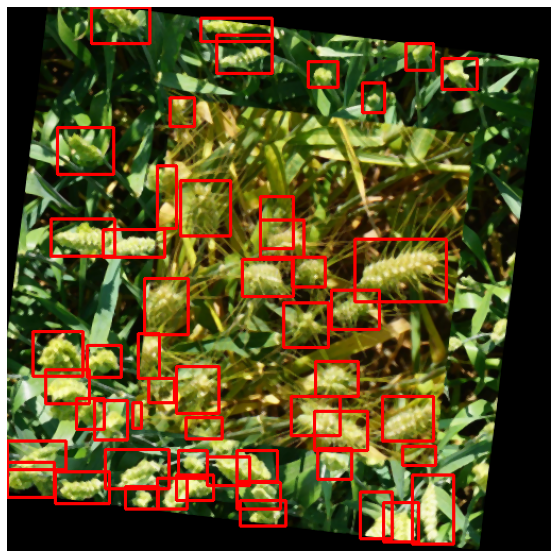

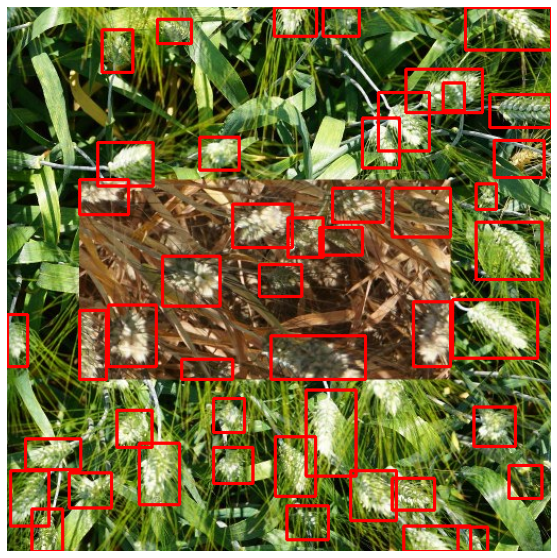

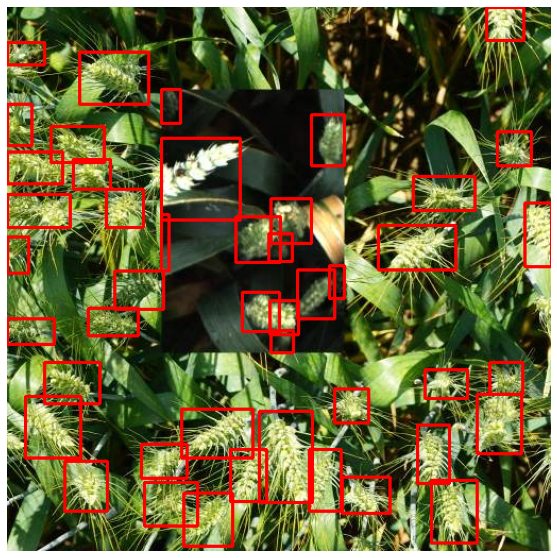

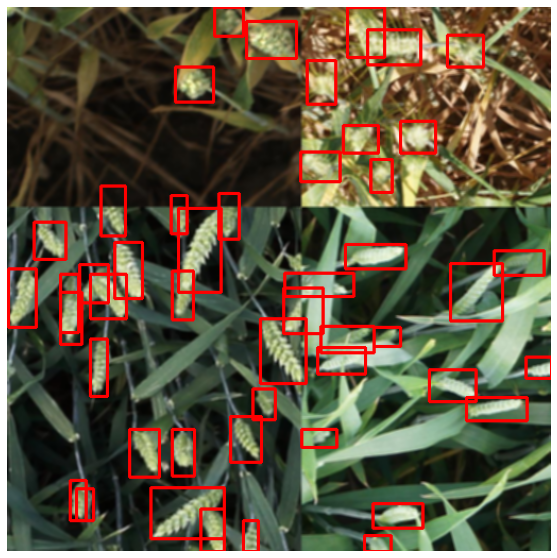

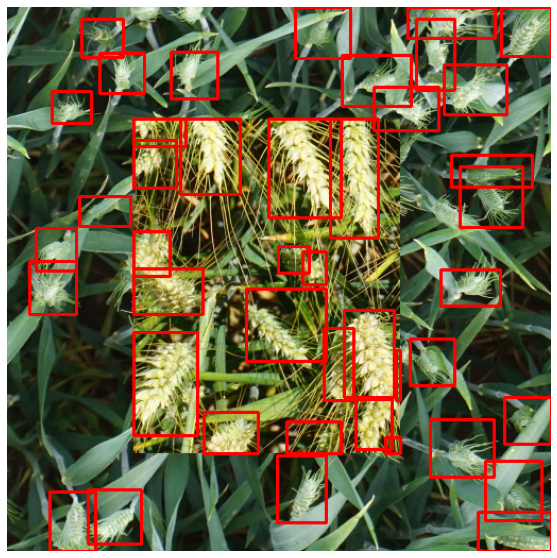

...

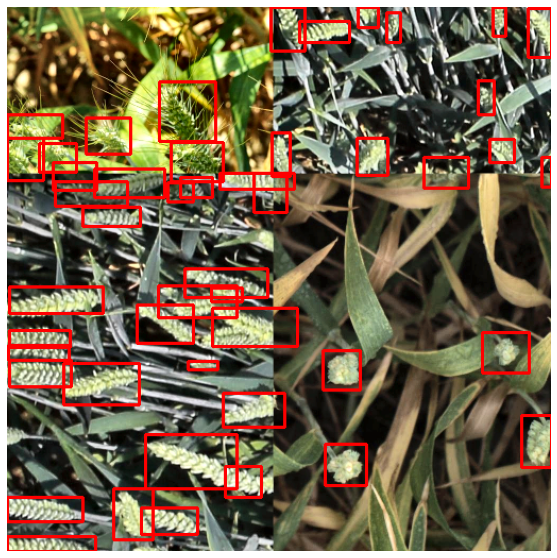

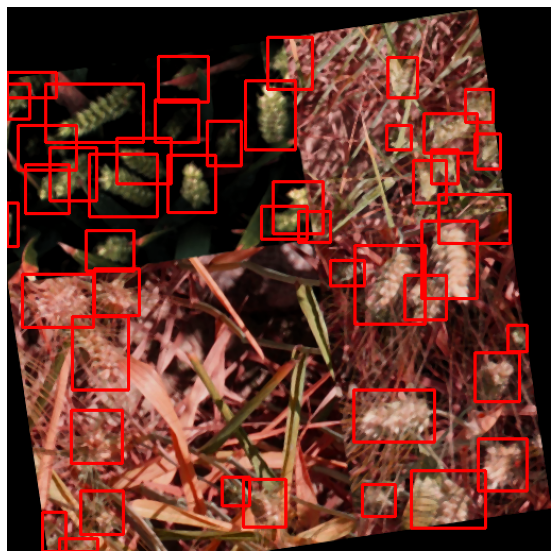

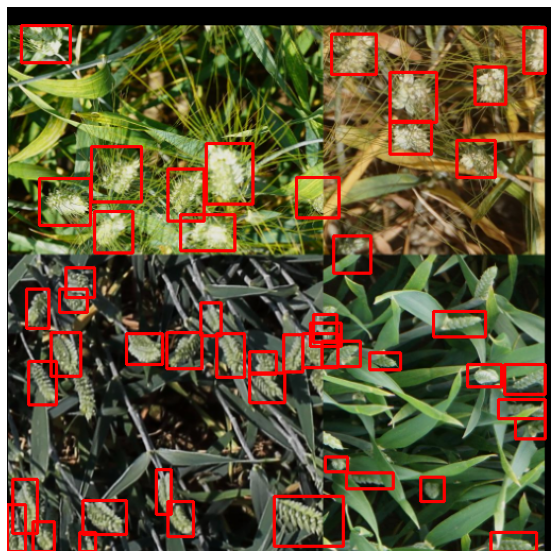

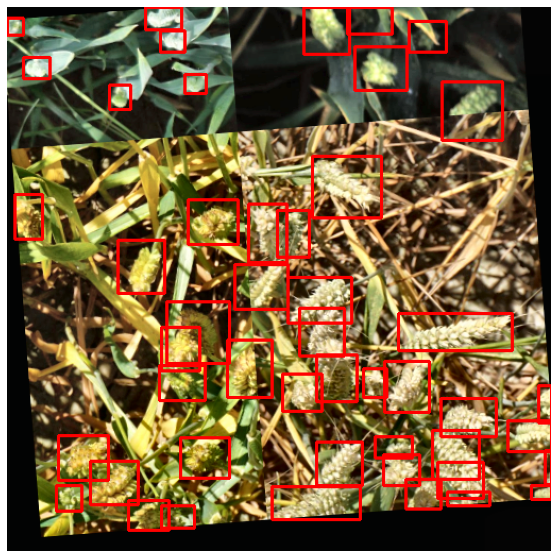

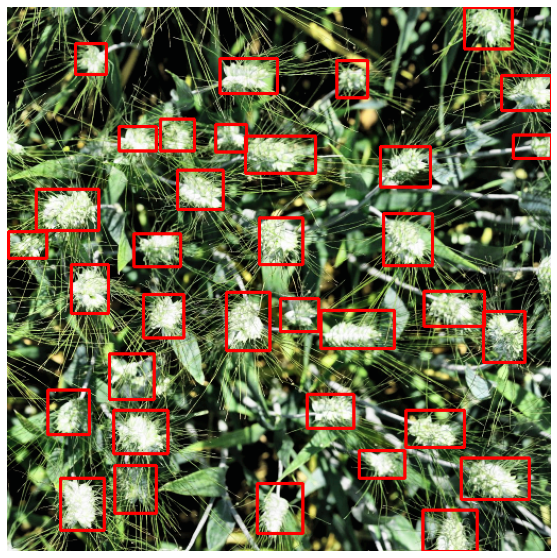

In [329]:
def mixup(data, targets, alpha=5):
    indices = np.random.permutation(data.size(0))
    temp = list(zip(data, targets['bbox'], targets['cls'], targets['img_scale'], targets['img_size'])) 
    random.shuffle(temp) 
    shuffled_targets = {}
    shuffled_data, shuffled_targets['bbox'], shuffled_targets['cls'], shuffled_targets['img_scale'], shuffled_targets['img_size'] = zip(*temp) 
    lam = np.random.beta(alpha, alpha)
    data = [d * lam for d in data]
    shuffled_data = [d * (1-lam) for d in shuffled_data]
    new_dat = []
    data = [new_dat.append(d + s) for d,s in zip(data, shuffled_data)]
    new_dat = torch.stack(new_dat)
    return new_dat, targets, shuffled_targets, lam

def simple_plot(image, target_boxes):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.cla()
    thickness = 3 if image.shape[0] > 512 else 2
    image = np.ascontiguousarray(image)
    for box in target_boxes:
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (255, 0, 0), thickness)
    ax.set_axis_off()
    ax.imshow(image)

def double_plot(image, target_boxes, pred_boxes):
    fig, ax = plt.subplots(1, 1, figsize=(8, 8))
    ax.cla()
    thickness = 3 if image.shape[0] > 512 else 2
    #image = cv2.UMat(image).get()
    image = np.ascontiguousarray(image)
    for box in target_boxes:
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (255, 0, 0), thickness)
    for box in pred_boxes:
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (0, 0, 255), thickness)
    ax.set_axis_off()
    ax.imshow(image)

def display_augs(dataset_name, batch_size=16):
    loader = DataLoader(
        get_training_datasets()[dataset_name], 
        batch_size=batch_size, shuffle=False, 
        num_workers=4, collate_fn=collate_fn
    )
    device = 'cuda'
    with torch.no_grad():
        if dataset_name == 'train':
            for images, targets, image_ids in loader:
                images = torch.stack(images)
                images = images.to(device).float()
                boxes1 = [b["bbox"].to(device, dtype=torch.float32) for b in targets] 
                labels1 = [l['cls'].to(device, dtype=torch.float32) for l in targets]
                img_size = torch.ones((2,), dtype=torch.float32)
                img_size = img_size.new_full(
                    (images.shape[0], 2), float(IMG_SIZE), device=device
                )
                img_scale = torch.tensor(
                    [1.], dtype=torch.float32, device=device
                )
                t = {} 
                t["bbox"] = boxes1 
                t["cls"] = labels1
                t['img_scale'] = img_scale
                t['img_size'] = img_size
                for image, target, image_id in zip(images, targets, image_ids):
                    sample = image.permute(1,2,0).detach().cpu().numpy()
                    sample = (sample  * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
                    boxes1 = target['bbox'].detach().cpu().numpy().astype(np.int32)
                    boxes1 = boxes1[:,[1,0,3,2]]
                    simple_plot(sample, boxes1)
                    print(image_id)
                break
        else:
            for images, targets1, image_ids in loader:
                images = torch.stack(images)
                images = images.to(device).float()
                for image, target1, image_id in zip(images, targets1, image_ids):
                    sample = image.permute(1,2,0).detach().cpu().numpy()
                    sample = (sample  * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
                    boxes1 = target1['bbox'].detach().cpu().numpy().astype(np.int32)
                    boxes1 = boxes1[:,[1,0,3,2]]
                    simple_plot(sample, boxes1)
                    print(image_id)
                break

display_augs('train')

## Scoring script

In [10]:
@jit(nopython=True)
def calculate_iou(gt, pr, form='pascal_voc') -> float:
    """Calculates the Intersection over Union.

    Args:
        gt: (np.ndarray[Union[int, float]]) coordinates of the ground-truth box
        pr: (np.ndarray[Union[int, float]]) coordinates of the prdected box
        form: (str) gt/pred coordinates format
            - pascal_voc: [xmin, ymin, xmax, ymax]
            - coco: [xmin, ymin, w, h]
    Returns:
        (float) Intersection over union (0.0 <= iou <= 1.0)
    """
    if form == 'coco':
        gt = gt.copy()
        pr = pr.copy()

        gt[2] = gt[0] + gt[2]
        gt[3] = gt[1] + gt[3]
        pr[2] = pr[0] + pr[2]
        pr[3] = pr[1] + pr[3]

    # Calculate overlap area

    dx = min(gt[2], pr[2]) - max(gt[0], pr[0]) + 1
    
    if dx < 0:
        return 0.0
    
    dy = min(gt[3], pr[3]) - max(gt[1], pr[1]) + 1

    if dy < 0:
        return 0.0

    overlap_area = dx * dy

    # Calculate union area
    union_area = (
            (gt[2] - gt[0] + 1) * (gt[3] - gt[1] + 1) +
            (pr[2] - pr[0] + 1) * (pr[3] - pr[1] + 1) -
            overlap_area
    )

    return overlap_area / union_area

@jit(nopython=True)
def find_best_match(gts, pred, pred_idx, threshold = 0.5, form = 'pascal_voc', ious=None) -> int:
    """Returns the index of the 'best match' between the
    ground-truth boxes and the prediction. The 'best match'
    is the highest IoU. (0.0 IoUs are ignored).

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        pred: (List[Union[int, float]]) Coordinates of the predicted box
        pred_idx: (int) Index of the current predicted box
        threshold: (float) Threshold
        form: (str) Format of the coordinates
        ious: (np.ndarray) len(gts) x len(preds) matrix for storing calculated ious.

    Return:
        (int) Index of the best match GT box (-1 if no match above threshold)
    """
    best_match_iou = -np.inf
    best_match_idx = -1

    for gt_idx in range(len(gts)):
        #print(gts[gt_idx][0])
        if gts[gt_idx][0] < 0:
            # Already matched GT-box
            continue
        
        iou = -1 if ious is None else ious[gt_idx][pred_idx]

        if iou < 0:
            iou = calculate_iou(gts[gt_idx], pred, form=form)
            
            if ious is not None:
                ious[gt_idx][pred_idx] = iou

        if iou < threshold:
            continue

        if iou > best_match_iou:
            best_match_iou = iou
            best_match_idx = gt_idx

    return best_match_idx

@jit(nopython=True)
def calculate_precision(gts, preds, threshold = 0.5, form = 'coco', ious=None) -> float:
    """Calculates precision for GT - prediction pairs at one threshold.

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        preds: (List[List[Union[int, float]]]) Coordinates of the predicted boxes,
               sorted by confidence value (descending)
        threshold: (float) Threshold
        form: (str) Format of the coordinates
        ious: (np.ndarray) len(gts) x len(preds) matrix for storing calculated ious.

    Return:
        (float) Precision
    """
    n = len(preds)
    tp = 0
    fp = 0
    
    # for pred_idx, pred in enumerate(preds_sorted):
    for pred_idx in range(n):

        best_match_gt_idx = find_best_match(gts, preds[pred_idx], pred_idx,
                                            threshold=threshold, form=form, ious=ious)

        if best_match_gt_idx >= 0:
            # True positive: The predicted box matches a gt box with an IoU above the threshold.
            tp += 1
            # Remove the matched GT box
            gts[best_match_gt_idx] = -1

        else:
            # No match
            # False positive: indicates a predicted box had no associated gt box.
            fp += 1

    # False negative: indicates a gt box had no associated predicted box.
    fn = (gts.sum(axis=1) > 0).sum()

    return tp / (tp + fp + fn)

@jit(nopython=True)
def calculate_image_precision(gts, preds, thresholds = (0.5, ), form = 'pascal_voc') -> float:
    """Calculates image precision.

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        preds: (List[List[Union[int, float]]]) Coordinates of the predicted boxes,
               sorted by confidence value (descending)
        thresholds: (float) Different thresholds
        form: (str) Format of the coordinates

    Return:
        (float) Precision
    """
    n_threshold = len(thresholds)
    image_precision = 0.0
    
    ious = np.ones((len(gts), len(preds))) * -1
    # ious = None

    for threshold in thresholds:
        precision_at_threshold = calculate_precision(gts.copy(), preds, threshold=threshold,
                                                     form=form, ious=ious)
        image_precision += precision_at_threshold / n_threshold

    return image_precision

iou_thresholds = numba.typed.List()
for x in [0.5, 0.55, 0.6, 0.65, 0.7, 0.75]:
    iou_thresholds.append(x)


## Model

In [11]:
def unfreeze_all_layers(model):
    layers_to_train = ['blocks.6','blocks.5', 'blocks.4', 'blocks.3', 'blocks.2', 'blocks.1', 'conv_stem'][:5]
    for name, parameter in model.model.backbone.named_parameters():
        if all([not name.startswith(layer) for layer in layers_to_train]):
            parameter.requires_grad_(True)
            print(f'{name} layer unfrozen')
    return model

def get_train_model(config_name='tf_efficientdet_d0', model_ckpt=None):
    config = get_efficientdet_config(config_name)
    model = EfficientDet(config, pretrained_backbone=True)
    
    #layers_to_train = ['blocks.6','blocks.5', 'blocks.4', 'blocks.3', 'blocks.2', 'blocks.1', 'conv_stem'][:5]
    #for name, parameter in model.backbone.named_parameters():
    #    if all([not name.startswith(layer) for layer in layers_to_train]):
    #        parameter.requires_grad_(False)
    #        print(f'layer {name} frozen')

    config.num_classes = 1
    config.image_size = IMG_SIZE
    model.class_net = HeadNet(config, num_outputs=config.num_classes, norm_kwargs=dict(eps=.001, momentum=.01))
    if model_ckpt is not None:
        model.load_state_dict(torch.load(model_ckpt)['model_state_dict'])
    return DetBenchTrain(model, config)

#model = get_train_model('tf_efficientdet_d3')
#model.train()
#model = unfreeze_all_layers(model)


## Train Scripts

In [12]:
def train_one_epoch(loader, model, optimizer, device, scaler, scheduler=None, log=False):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    optimizer.zero_grad()
    for i, (images, targets, _) in tqdm(enumerate(loader), total=len(loader)):  
        images = torch.stack(images)
        images = images.to(device).float()
        boxes = [b["bbox"].to(device, dtype=torch.float32) for b in targets] 
        labels = [l['cls'].to(device, dtype=torch.float32) for l in targets]

        img_size = torch.ones((2,), dtype=torch.float32)
        img_size = img_size.new_full((images.shape[0], 2), float(IMG_SIZE), device=device)
        img_scale = torch.tensor(
            [1.],
            #[640/IMG_SIZE]*images.shape[0], # use 512 + 128x
            dtype=torch.float32, device=device
        )

        t = {} 
        t["bbox"] = boxes
        t["cls"] = labels
        t['img_scale'] = img_scale
        t['img_size'] = img_size

        # ['loss', 'class_loss', 'box_loss', 'detections']
        loss_dict = model(images, t)
        losses = loss_dict['loss'] / FLAGS['accumulation_steps']
        total_loss = losses

        loss_value = total_loss.item()
        running_loss += float(loss_value)
        batch_loss += float(loss_value)
        
        if scaler:
            scaler.scale(total_loss).backward()
        else:
            (total_loss).backward()

        if (i+1) % FLAGS['accumulation_steps'] == 0:
            if scaler:
                scaler.step(optimizer)
                scaler.update()
            else:
                optimizer.step()
            optimizer.zero_grad()
            if scheduler:
                scheduler.step()
            if log and (i+1) % FLAGS['log_step'] == 0:
                neptune.log_metric('batch_loss/train', batch_loss)
            batch_loss = 0.0
                    
    return running_loss/len(loader)

def val_one_epoch(model, loader):
    model.eval()
    running_loss = 0.0
    validation_image_precisions = []
    with torch.no_grad():
        for idx, (images, targets, _) in tqdm(enumerate(loader), total=len(loader)):
            images = torch.stack(images)
            images = images.to(device).float()
            gt_boxes = np.array(list(target['bbox'].data.cpu().numpy() for target in targets))
            gt_labels = np.array(list(target['cls'].data.cpu().numpy() for target in targets))
            boxes = [b["bbox"].to(device, dtype=torch.float32) for b in targets] 
            labels = [l['cls'].to(device, dtype=torch.float32) for l in targets]
            
            t = {} 
            t["bbox"] = boxes 
            t["cls"] = labels
            
            img_scales = torch.tensor([1]*images.shape[0], dtype=torch.float32, device=device)
            img_size = torch.ones((2,), dtype=torch.float32)
            img_size = img_size.new_full((images.shape[0], 2), float(IMG_SIZE)).to(device)
            t['img_scale'] = img_scales
            t['img_size'] = img_size
            outputs = model(images, t)
            running_loss += float(outputs['loss'])

            # ['loss', 'class_loss', 'box_loss', 'detections']
            for i in range(images.shape[0]): 
                pred_boxes = outputs.get('detections')[i].detach().cpu().numpy()[:,:4]    
                scores = outputs.get('detections')[i].detach().cpu().numpy()[:,4]
                indexes = np.where(scores > 0.4)[0]
                pred_boxes = pred_boxes.astype(np.int32)
                #xywh (coco)-> xyxy (pascal_voc)= x,y,x+w,y+h
                pred_boxes[:, 2] = pred_boxes[:, 2] + pred_boxes[:, 0]
                pred_boxes[:, 3] = pred_boxes[:, 3] + pred_boxes[:, 1]
                target_boxes = gt_boxes[i].astype(np.int32)
                target_boxes = target_boxes[:,[1,0,3,2]]
                image_precision = calculate_image_precision(
                    target_boxes, pred_boxes[indexes],
                    thresholds=iou_thresholds,
                    form='pascal_voc'
                )
                validation_image_precisions.append(image_precision)
             
    return np.array(validation_image_precisions).mean(), running_loss/len(loader)

def save_upload(bench, optimizer, epoch, scheduler, val_metric, exp_name, fold=None):
    if fold is not None:
        NAME = exp_name+f'_fold_{fold}_{str(epoch+1)}_map_'+ str(round(val_metric, 4)) +'.ckpt'
    
    NAME = exp_name+f'_{str(epoch+1)}_map_'+ str(round(val_metric, 5)) +'.ckpt'
    MODEL_PATH = NAME
    torch.save({
        'model_state_dict': bench.model.state_dict(),
    }, MODEL_PATH)
    print(f"Saved ckpt for epoch {epoch+1}")
    # upload_blob(MODEL_PATH, NAME)
    # print(f"Uploaded ckpt for epoch {epoch+1}")


In [13]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def train_job(model_name, model_ckpt=None, log=True):
    exp_name = FLAGS['exp_name']
    if log:
        neptune.set_project('utsav/wheat-det')
        neptune.init('utsav/wheat-det', api_token=NEPTUNE_API_TOKEN)
        neptune.create_experiment(
            FLAGS['exp_name'], exp_description, params=FLAGS,
            upload_source_files='*.txt'
        )
    best_score = 0.0
    start_epoch = 0

    # sampler
    class_counts = train_df.groupby('folds').nunique()['image_id'].values
    num_samples = sum(class_counts)
    class_weights = {i: num_samples/class_counts[i] for i in range(len(class_counts))}
    keys = train_df.groupby('folds').nunique().index.tolist()
    new_class_weights = {new_k: class_weights.get(old_k) for old_k, new_k in zip(class_weights, keys)}
    train_unique_ids = train_df.drop_duplicates('image_id')
    weights = [new_class_weights[train_unique_ids['folds'].values[i]] for i in range(int(num_samples))]
    sampler = WeightedRandomSampler(torch.DoubleTensor(weights), int(num_samples))

    datasets = get_training_datasets()
    train_loader = DataLoader(
        datasets['train'], batch_size=FLAGS['batch_size'],
        num_workers=FLAGS['num_workers'], sampler=sampler, 
        # shuffle=True, #sampler=sampler
        collate_fn=collate_fn
    )
    val_loader = DataLoader(
        datasets['valid'], batch_size=FLAGS['batch_size']*2, shuffle=False,
        num_workers=FLAGS['num_workers'], collate_fn=collate_fn
    )

    if model_ckpt is not None:
        model = get_train_model(model_name, model_ckpt)
    else:
        model = get_train_model(model_name)
    model.to(device)

    #optimizer = Ranger(
    #    model.parameters(),
    #    lr=FLAGS['learning_rate'], 
    #    alpha=0.5, k=6, N_sma_threshhold=5,
    #    weight_decay=FLAGS['weight_decay']
    #)
    optimizer = SGD(
        model.parameters(), lr=FLAGS['learning_rate'], 
        momentum=FLAGS['momentum'], weight_decay=FLAGS['weight_decay'], 
        nesterov=False
    )
    #scheduler = lr_scheduler.ReduceLROnPlateau(
    #    optimizer, 'min', factor=0.5, verbose=True, 
    #    patience=FLAGS['scheduler_pat'] 
    #)
    #scheduler = lr_scheduler.CosineAnnealingLR(
    #    optimizer, FLAGS['num_epochs'], eta_min=0
    #)
    scheduler = lr_scheduler.OneCycleLR(
        optimizer, epochs=FLAGS['num_epochs'],
        steps_per_epoch=len(train_loader),
        max_lr=FLAGS['learning_rate']
    )

    scaler = GradScaler()
    for epoch in range(start_epoch, FLAGS['num_epochs']):

        print('-'*27 + f'Epoch #{epoch+1} started' + '-'*27)
        
        print(f'lr : {scheduler.get_last_lr()[0]:.8f}')
        train_loss = train_one_epoch(
            train_loader, model, optimizer, 
            device, scaler, scheduler=scheduler, log=log
        )
        print(f'\nloss/train : {train_loss:.5f}')
        
        val_metric, val_loss = val_one_epoch(model, val_loader)
        #scheduler.step() # val_loss

        print(f'\nmetric/val : {val_metric:.5f}')
        print(f'loss/val : {val_loss:.5f}')
        
        if log:
            neptune.log_metric('metric/val', val_metric)
            neptune.log_metric('loss/val', val_loss)

        if (val_metric > best_score) or (best_score-val_metric<0.01): 
            if (val_metric > best_score):
                best_score = val_metric
            if epoch>9:
                save_upload(
                    model, optimizer, epoch, 
                    scheduler, val_metric, 
                    exp_name=FLAGS['exp_name']
                )

        print('-'*28 + f'Epoch #{epoch+1} ended' + '-'*28)

    neptune.stop()


## Train

In [15]:
model_name = "tf_efficientdet_d1" #@param ["tf_efficientdet_d0", "tf_efficientdet_d1", "tf_efficientdet_d2", "tf_efficientdet_d3", "tf_efficientdet_d4", "tf_efficientdet_d5", "tf_efficientdet_d6", "tf_efficientdet_d7"]
FLAGS = {}
FLAGS['num_workers'] = 4
FLAGS['batch_size'] = 16
FLAGS['accumulation_steps'] = 2
FLAGS['learning_rate'] = 1e-2 #2e-3
FLAGS['momentum'] = 0.9
FLAGS['weight_decay'] = 3e-3
FLAGS['num_epochs'] = 125
FLAGS['exp_name'] = model_name
FLAGS['fold'] = '0, 3, 5'
FLAGS['log_step'] = 10
# FLAGS['scheduler_pat'] = 7
exp_description = f'''
{model_name},
continuation
WeightedSampler
SGD, OneCycle
Aug + 33% Cutmix,
imsize 512
'''
try:
    train_job(model_name, log=True)
except KeyboardInterrupt:
    neptune.stop()
except:
    neptune.stop()

https://ui.neptune.ai/utsav/wheat-det/e/WHEAT-110
---------------------------Epoch #1 started---------------------------
lr : 0.00040000


100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24261



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]



metric/val : 0.41495
loss/val : 0.62480
----------------------------Epoch #1 ended----------------------------
---------------------------Epoch #2 started---------------------------
lr : 0.00040421


100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24105



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.40592
loss/val : 0.63285
----------------------------Epoch #2 ended----------------------------
---------------------------Epoch #3 started---------------------------
lr : 0.00041684



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24102



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.42227
loss/val : 0.62010
----------------------------Epoch #3 ended----------------------------
---------------------------Epoch #4 started---------------------------
lr : 0.00043786



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24150



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.41301
loss/val : 0.62686
----------------------------Epoch #4 ended----------------------------
---------------------------Epoch #5 started---------------------------
lr : 0.00046724



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24126



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.40706
loss/val : 0.63362
----------------------------Epoch #5 ended----------------------------
---------------------------Epoch #6 started---------------------------
lr : 0.00050493



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24247



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.41533
loss/val : 0.62647
----------------------------Epoch #6 ended----------------------------
---------------------------Epoch #7 started---------------------------
lr : 0.00055086



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24029



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.41179
loss/val : 0.62814
----------------------------Epoch #7 ended----------------------------
---------------------------Epoch #8 started---------------------------
lr : 0.00060494



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24207



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.43096
loss/val : 0.61406
----------------------------Epoch #8 ended----------------------------
---------------------------Epoch #9 started---------------------------
lr : 0.00066709



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24139



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.43164
loss/val : 0.61320
----------------------------Epoch #9 ended----------------------------
---------------------------Epoch #10 started---------------------------
lr : 0.00073720



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24107



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.39960
loss/val : 0.63651
----------------------------Epoch #10 ended----------------------------
---------------------------Epoch #11 started---------------------------
lr : 0.00081514



100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.23887



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.40355
loss/val : 0.63290
----------------------------Epoch #11 ended----------------------------
---------------------------Epoch #12 started---------------------------
lr : 0.00090077



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24170



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.41880
loss/val : 0.62417
----------------------------Epoch #12 ended----------------------------
---------------------------Epoch #13 started---------------------------
lr : 0.00099395



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24074



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.43638
loss/val : 0.61085
Saved ckpt for epoch 13
----------------------------Epoch #13 ended----------------------------
---------------------------Epoch #14 started---------------------------
lr : 0.00109451



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24012



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.43579
loss/val : 0.61012
Saved ckpt for epoch 14
----------------------------Epoch #14 ended----------------------------
---------------------------Epoch #15 started---------------------------
lr : 0.00120227



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23914



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.40082
loss/val : 0.63305
----------------------------Epoch #15 ended----------------------------
---------------------------Epoch #16 started---------------------------
lr : 0.00131706



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24042



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.43160
loss/val : 0.61694
Saved ckpt for epoch 16
----------------------------Epoch #16 ended----------------------------
---------------------------Epoch #17 started---------------------------
lr : 0.00143865



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24053



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.40855
loss/val : 0.63237
----------------------------Epoch #17 ended----------------------------
---------------------------Epoch #18 started---------------------------
lr : 0.00156685



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24177



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.41807
loss/val : 0.61952
----------------------------Epoch #18 ended----------------------------
---------------------------Epoch #19 started---------------------------
lr : 0.00170142



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23866



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.43982
loss/val : 0.60822
Saved ckpt for epoch 19
----------------------------Epoch #19 ended----------------------------
---------------------------Epoch #20 started---------------------------
lr : 0.00184214



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23772



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.41301
loss/val : 0.62879
----------------------------Epoch #20 ended----------------------------
---------------------------Epoch #21 started---------------------------
lr : 0.00198874



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23858



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.38716
loss/val : 0.64617
----------------------------Epoch #21 ended----------------------------
---------------------------Epoch #22 started---------------------------
lr : 0.00214098



100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.23889



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.40539
loss/val : 0.63305
----------------------------Epoch #22 ended----------------------------
---------------------------Epoch #23 started---------------------------
lr : 0.00229860



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23962



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.37914
loss/val : 0.64814
----------------------------Epoch #23 ended----------------------------
---------------------------Epoch #24 started---------------------------
lr : 0.00246130



100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.24013



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.39017
loss/val : 0.64168
----------------------------Epoch #24 ended----------------------------
---------------------------Epoch #25 started---------------------------
lr : 0.00262881



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23892



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.40842
loss/val : 0.62641
----------------------------Epoch #25 ended----------------------------
---------------------------Epoch #26 started---------------------------
lr : 0.00280083



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23927



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.39833
loss/val : 0.63692
----------------------------Epoch #26 ended----------------------------
---------------------------Epoch #27 started---------------------------
lr : 0.00297706



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23751



100%|██████████| 36/36 [00:27<00:00,  1.33it/s]


metric/val : 0.33210
loss/val : 0.68095
----------------------------Epoch #27 ended----------------------------
---------------------------Epoch #28 started---------------------------
lr : 0.00315720



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23879



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.39984
loss/val : 0.63561
----------------------------Epoch #28 ended----------------------------
---------------------------Epoch #29 started---------------------------
lr : 0.00334091



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23715



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.40577
loss/val : 0.63077
----------------------------Epoch #29 ended----------------------------
---------------------------Epoch #30 started---------------------------
lr : 0.00352790



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23781



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.42533
loss/val : 0.61648
----------------------------Epoch #30 ended----------------------------
---------------------------Epoch #31 started---------------------------
lr : 0.00371781



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23837



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.40154
loss/val : 0.63076
----------------------------Epoch #31 ended----------------------------
---------------------------Epoch #32 started---------------------------
lr : 0.00391033



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23776



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.32860
loss/val : 0.68063
----------------------------Epoch #32 ended----------------------------
---------------------------Epoch #33 started---------------------------
lr : 0.00410511



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23712



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.41754
loss/val : 0.62102
----------------------------Epoch #33 ended----------------------------
---------------------------Epoch #34 started---------------------------
lr : 0.00430181



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23680



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.40191
loss/val : 0.63470
----------------------------Epoch #34 ended----------------------------
---------------------------Epoch #35 started---------------------------
lr : 0.00450009



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23708



100%|██████████| 36/36 [00:27<00:00,  1.33it/s]


metric/val : 0.36490
loss/val : 0.66453
----------------------------Epoch #35 ended----------------------------
---------------------------Epoch #36 started---------------------------
lr : 0.00469960



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23840



100%|██████████| 36/36 [00:27<00:00,  1.31it/s]


metric/val : 0.35039
loss/val : 0.67067
----------------------------Epoch #36 ended----------------------------
---------------------------Epoch #37 started---------------------------
lr : 0.00489998



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23663



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.45081
loss/val : 0.60492
Saved ckpt for epoch 37
----------------------------Epoch #37 ended----------------------------
---------------------------Epoch #38 started---------------------------
lr : 0.00510089



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23650



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.36539
loss/val : 0.65504
----------------------------Epoch #38 ended----------------------------
---------------------------Epoch #39 started---------------------------
lr : 0.00530198



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23651



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.39791
loss/val : 0.63478
----------------------------Epoch #39 ended----------------------------
---------------------------Epoch #40 started---------------------------
lr : 0.00550289



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23804



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.37420
loss/val : 0.65342
----------------------------Epoch #40 ended----------------------------
---------------------------Epoch #41 started---------------------------
lr : 0.00570326



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23569



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.38483
loss/val : 0.64488
----------------------------Epoch #41 ended----------------------------
---------------------------Epoch #42 started---------------------------
lr : 0.00590275



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23497



100%|██████████| 36/36 [00:27<00:00,  1.33it/s]


metric/val : 0.40720
loss/val : 0.63447
----------------------------Epoch #42 ended----------------------------
---------------------------Epoch #43 started---------------------------
lr : 0.00610101



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23814



100%|██████████| 36/36 [00:27<00:00,  1.32it/s]


metric/val : 0.44714
loss/val : 0.60556
Saved ckpt for epoch 43
----------------------------Epoch #43 ended----------------------------
---------------------------Epoch #44 started---------------------------
lr : 0.00629769



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23781



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.37811
loss/val : 0.65029
----------------------------Epoch #44 ended----------------------------
---------------------------Epoch #45 started---------------------------
lr : 0.00649244



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23354



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.34357
loss/val : 0.67444
----------------------------Epoch #45 ended----------------------------
---------------------------Epoch #46 started---------------------------
lr : 0.00668492



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23380



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.39337
loss/val : 0.63530
----------------------------Epoch #46 ended----------------------------
---------------------------Epoch #47 started---------------------------
lr : 0.00687480



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23486



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.33899
loss/val : 0.67738
----------------------------Epoch #47 ended----------------------------
---------------------------Epoch #48 started---------------------------
lr : 0.00706173



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23586



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.30686
loss/val : 0.70503
----------------------------Epoch #48 ended----------------------------
---------------------------Epoch #49 started---------------------------
lr : 0.00724540



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23578



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.35060
loss/val : 0.67238
----------------------------Epoch #49 ended----------------------------
---------------------------Epoch #50 started---------------------------
lr : 0.00742548



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23777



100%|██████████| 36/36 [00:27<00:00,  1.33it/s]


metric/val : 0.37103
loss/val : 0.65759
----------------------------Epoch #50 ended----------------------------
---------------------------Epoch #51 started---------------------------
lr : 0.00760166



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23484



100%|██████████| 36/36 [00:27<00:00,  1.32it/s]


metric/val : 0.41105
loss/val : 0.62082
----------------------------Epoch #51 ended----------------------------
---------------------------Epoch #52 started---------------------------
lr : 0.00777362



100%|██████████| 140/140 [01:45<00:00,  1.33it/s]


loss/train : 0.23719



100%|██████████| 36/36 [00:27<00:00,  1.33it/s]


metric/val : 0.41449
loss/val : 0.62605
----------------------------Epoch #52 ended----------------------------
---------------------------Epoch #53 started---------------------------
lr : 0.00794106



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23748



100%|██████████| 36/36 [00:27<00:00,  1.32it/s]


metric/val : 0.37035
loss/val : 0.65793
----------------------------Epoch #53 ended----------------------------
---------------------------Epoch #54 started---------------------------
lr : 0.00810369



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23538



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.40170
loss/val : 0.63016
----------------------------Epoch #54 ended----------------------------
---------------------------Epoch #55 started---------------------------
lr : 0.00826123



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23987



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.35519
loss/val : 0.66339
----------------------------Epoch #55 ended----------------------------
---------------------------Epoch #56 started---------------------------
lr : 0.00841339



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23932



100%|██████████| 36/36 [00:26<00:00,  1.33it/s]


metric/val : 0.37888
loss/val : 0.64700
----------------------------Epoch #56 ended----------------------------
---------------------------Epoch #57 started---------------------------
lr : 0.00855992



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23794



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.27434
loss/val : 0.72925
----------------------------Epoch #57 ended----------------------------
---------------------------Epoch #58 started---------------------------
lr : 0.00870054



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23845



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.33683
loss/val : 0.67995
----------------------------Epoch #58 ended----------------------------
---------------------------Epoch #59 started---------------------------
lr : 0.00883503



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23525



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.41306
loss/val : 0.62976
----------------------------Epoch #59 ended----------------------------
---------------------------Epoch #60 started---------------------------
lr : 0.00896313



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23690



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.39488
loss/val : 0.63777
----------------------------Epoch #60 ended----------------------------
---------------------------Epoch #61 started---------------------------
lr : 0.00908463



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23601



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.35890
loss/val : 0.65962
----------------------------Epoch #61 ended----------------------------
---------------------------Epoch #62 started---------------------------
lr : 0.00919931



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23657



100%|██████████| 36/36 [00:26<00:00,  1.33it/s]


metric/val : 0.38902
loss/val : 0.63819
----------------------------Epoch #62 ended----------------------------
---------------------------Epoch #63 started---------------------------
lr : 0.00930698



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23624



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.38360
loss/val : 0.64433
----------------------------Epoch #63 ended----------------------------
---------------------------Epoch #64 started---------------------------
lr : 0.00940743



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23693



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.35263
loss/val : 0.66688
----------------------------Epoch #64 ended----------------------------
---------------------------Epoch #65 started---------------------------
lr : 0.00950051



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23851



100%|██████████| 36/36 [00:27<00:00,  1.32it/s]


metric/val : 0.31803
loss/val : 0.69506
----------------------------Epoch #65 ended----------------------------
---------------------------Epoch #66 started---------------------------
lr : 0.00958603



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.23639



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.29723
loss/val : 0.71913
----------------------------Epoch #66 ended----------------------------
---------------------------Epoch #67 started---------------------------
lr : 0.00966386



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23912



100%|██████████| 36/36 [00:27<00:00,  1.33it/s]


metric/val : 0.42929
loss/val : 0.61409
----------------------------Epoch #67 ended----------------------------
---------------------------Epoch #68 started---------------------------
lr : 0.00973385



100%|██████████| 140/140 [01:44<00:00,  1.35it/s]


loss/train : 0.23789



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.35107
loss/val : 0.67449
----------------------------Epoch #68 ended----------------------------
---------------------------Epoch #69 started---------------------------
lr : 0.00979589



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23919



100%|██████████| 36/36 [00:27<00:00,  1.33it/s]


metric/val : 0.28627
loss/val : 0.71074
----------------------------Epoch #69 ended----------------------------
---------------------------Epoch #70 started---------------------------
lr : 0.00984986



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23907



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.34931
loss/val : 0.66485
----------------------------Epoch #70 ended----------------------------
---------------------------Epoch #71 started---------------------------
lr : 0.00989567



100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.23735



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.39833
loss/val : 0.63542
----------------------------Epoch #71 ended----------------------------
---------------------------Epoch #72 started---------------------------
lr : 0.00993323



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23853



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.39909
loss/val : 0.63710
----------------------------Epoch #72 ended----------------------------
---------------------------Epoch #73 started---------------------------
lr : 0.00996250



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24015



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.35173
loss/val : 0.67615
----------------------------Epoch #73 ended----------------------------
---------------------------Epoch #74 started---------------------------
lr : 0.00998340



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23969



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.39171
loss/val : 0.63928
----------------------------Epoch #74 ended----------------------------
---------------------------Epoch #75 started---------------------------
lr : 0.00999591



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24427



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.33923
loss/val : 0.66580
----------------------------Epoch #75 ended----------------------------
---------------------------Epoch #76 started---------------------------
lr : 0.01000000



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23897



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.41591
loss/val : 0.62338
----------------------------Epoch #76 ended----------------------------
---------------------------Epoch #77 started---------------------------
lr : 0.00999917



100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.23894



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.43242
loss/val : 0.61653
----------------------------Epoch #77 ended----------------------------
---------------------------Epoch #78 started---------------------------
lr : 0.00999673



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24146



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.40629
loss/val : 0.63340
----------------------------Epoch #78 ended----------------------------
---------------------------Epoch #79 started---------------------------
lr : 0.00999268



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23864



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.26949
loss/val : 0.73900
----------------------------Epoch #79 ended----------------------------
---------------------------Epoch #80 started---------------------------
lr : 0.00998702



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23984



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.44405
loss/val : 0.60542
Saved ckpt for epoch 80
----------------------------Epoch #80 ended----------------------------
---------------------------Epoch #81 started---------------------------
lr : 0.00997976



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24029



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.40966
loss/val : 0.65440
----------------------------Epoch #81 ended----------------------------
---------------------------Epoch #82 started---------------------------
lr : 0.00997089



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24191



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.43067
loss/val : 0.61475
----------------------------Epoch #82 ended----------------------------
---------------------------Epoch #83 started---------------------------
lr : 0.00996041



100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.24021



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.35370
loss/val : 0.65311
----------------------------Epoch #83 ended----------------------------
---------------------------Epoch #84 started---------------------------
lr : 0.00994834



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24227



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.38316
loss/val : 0.65183
----------------------------Epoch #84 ended----------------------------
---------------------------Epoch #85 started---------------------------
lr : 0.00993468



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24035



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.36111
loss/val : 0.66997
----------------------------Epoch #85 ended----------------------------
---------------------------Epoch #86 started---------------------------
lr : 0.00991942



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.23960



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.28246
loss/val : 0.71794
----------------------------Epoch #86 ended----------------------------
---------------------------Epoch #87 started---------------------------
lr : 0.00990258



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24286



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.38116
loss/val : 0.64871
----------------------------Epoch #87 ended----------------------------
---------------------------Epoch #88 started---------------------------
lr : 0.00988416



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24130



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.36717
loss/val : 0.66476
----------------------------Epoch #88 ended----------------------------
---------------------------Epoch #89 started---------------------------
lr : 0.00986416



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24059



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.32187
loss/val : 0.68943
----------------------------Epoch #89 ended----------------------------
---------------------------Epoch #90 started---------------------------
lr : 0.00984260



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.23873



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.42627
loss/val : 0.61204
----------------------------Epoch #90 ended----------------------------
---------------------------Epoch #91 started---------------------------
lr : 0.00981947



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24440



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.39430
loss/val : 0.64212
----------------------------Epoch #91 ended----------------------------
---------------------------Epoch #92 started---------------------------
lr : 0.00979480



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24104



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.40187
loss/val : 0.62471
----------------------------Epoch #92 ended----------------------------
---------------------------Epoch #93 started---------------------------
lr : 0.00976857



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24169



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.33571
loss/val : 0.68030
----------------------------Epoch #93 ended----------------------------
---------------------------Epoch #94 started---------------------------
lr : 0.00974082



100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.24360



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.37152
loss/val : 0.64351
----------------------------Epoch #94 ended----------------------------
---------------------------Epoch #95 started---------------------------
lr : 0.00971153



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24115



100%|██████████| 36/36 [00:26<00:00,  1.38it/s]


metric/val : 0.36003
loss/val : 0.66420
----------------------------Epoch #95 ended----------------------------
---------------------------Epoch #96 started---------------------------
lr : 0.00968072



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24601



100%|██████████| 36/36 [00:26<00:00,  1.38it/s]


metric/val : 0.36551
loss/val : 0.67292
----------------------------Epoch #96 ended----------------------------
---------------------------Epoch #97 started---------------------------
lr : 0.00964841



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24523



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]



metric/val : 0.47898
loss/val : 0.57613
Saved ckpt for epoch 97
----------------------------Epoch #97 ended----------------------------
---------------------------Epoch #98 started---------------------------
lr : 0.00961460


100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.24367



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.35719
loss/val : 0.65999
----------------------------Epoch #98 ended----------------------------
---------------------------Epoch #99 started---------------------------
lr : 0.00957930



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24478



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.42006
loss/val : 0.62312
----------------------------Epoch #99 ended----------------------------
---------------------------Epoch #100 started---------------------------
lr : 0.00954253



100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.24628



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.32555
loss/val : 0.69795
----------------------------Epoch #100 ended----------------------------
---------------------------Epoch #101 started---------------------------
lr : 0.00950429



100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.24570



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.37543
loss/val : 0.65831
----------------------------Epoch #101 ended----------------------------
---------------------------Epoch #102 started---------------------------
lr : 0.00946460



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24336



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.30889
loss/val : 0.70053
----------------------------Epoch #102 ended----------------------------
---------------------------Epoch #103 started---------------------------
lr : 0.00942347



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24356



100%|██████████| 36/36 [00:26<00:00,  1.37it/s]


metric/val : 0.34181
loss/val : 0.68711
----------------------------Epoch #103 ended----------------------------
---------------------------Epoch #104 started---------------------------
lr : 0.00938092



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24700



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.19142
loss/val : 0.82262
----------------------------Epoch #104 ended----------------------------
---------------------------Epoch #105 started---------------------------
lr : 0.00933695



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24818



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.42547
loss/val : 0.61866
----------------------------Epoch #105 ended----------------------------
---------------------------Epoch #106 started---------------------------
lr : 0.00929159



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24566



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.29711
loss/val : 0.70717
----------------------------Epoch #106 ended----------------------------
---------------------------Epoch #107 started---------------------------
lr : 0.00924484



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24710



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.30567
loss/val : 0.69862
----------------------------Epoch #107 ended----------------------------
---------------------------Epoch #108 started---------------------------
lr : 0.00919673



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24834



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.40594
loss/val : 0.62661
----------------------------Epoch #108 ended----------------------------
---------------------------Epoch #109 started---------------------------
lr : 0.00914726



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24897



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.42032
loss/val : 0.61602
----------------------------Epoch #109 ended----------------------------
---------------------------Epoch #110 started---------------------------
lr : 0.00909646



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24818



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.31588
loss/val : 0.70424
----------------------------Epoch #110 ended----------------------------
---------------------------Epoch #111 started---------------------------
lr : 0.00904433



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24875



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.38381
loss/val : 0.64703
----------------------------Epoch #111 ended----------------------------
---------------------------Epoch #112 started---------------------------
lr : 0.00899091



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.24400



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.42871
loss/val : 0.61038
----------------------------Epoch #112 ended----------------------------
---------------------------Epoch #113 started---------------------------
lr : 0.00893620



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24884



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.41383
loss/val : 0.62493
----------------------------Epoch #113 ended----------------------------
---------------------------Epoch #114 started---------------------------
lr : 0.00888021



100%|██████████| 140/140 [01:42<00:00,  1.36it/s]


loss/train : 0.24895



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.28365
loss/val : 0.73185
----------------------------Epoch #114 ended----------------------------
---------------------------Epoch #115 started---------------------------
lr : 0.00882298



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24791



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.34362
loss/val : 0.69300
----------------------------Epoch #115 ended----------------------------
---------------------------Epoch #116 started---------------------------
lr : 0.00876452



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24997



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.39381
loss/val : 0.64192
----------------------------Epoch #116 ended----------------------------
---------------------------Epoch #117 started---------------------------
lr : 0.00870484



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24952



100%|██████████| 36/36 [00:26<00:00,  1.36it/s]


metric/val : 0.28694
loss/val : 0.72974
----------------------------Epoch #117 ended----------------------------
---------------------------Epoch #118 started---------------------------
lr : 0.00864397



100%|██████████| 140/140 [01:43<00:00,  1.36it/s]


loss/train : 0.25045



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.37476
loss/val : 0.66567
----------------------------Epoch #118 ended----------------------------
---------------------------Epoch #119 started---------------------------
lr : 0.00858193



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.25124



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.31609
loss/val : 0.69886
----------------------------Epoch #119 ended----------------------------
---------------------------Epoch #120 started---------------------------
lr : 0.00851873



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.24867



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.27734
loss/val : 0.75033
----------------------------Epoch #120 ended----------------------------
---------------------------Epoch #121 started---------------------------
lr : 0.00845439



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.25058



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.36014
loss/val : 0.66329
----------------------------Epoch #121 ended----------------------------
---------------------------Epoch #122 started---------------------------
lr : 0.00838895



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.25133



100%|██████████| 36/36 [00:27<00:00,  1.33it/s]


metric/val : 0.39695
loss/val : 0.65341
----------------------------Epoch #122 ended----------------------------
---------------------------Epoch #123 started---------------------------
lr : 0.00832241



100%|██████████| 140/140 [01:43<00:00,  1.35it/s]


loss/train : 0.25166



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]


metric/val : 0.34733
loss/val : 0.66405
----------------------------Epoch #123 ended----------------------------
---------------------------Epoch #124 started---------------------------
lr : 0.00825480



100%|██████████| 140/140 [01:44<00:00,  1.34it/s]


loss/train : 0.25230



100%|██████████| 36/36 [00:26<00:00,  1.34it/s]


metric/val : 0.39785
loss/val : 0.63846
----------------------------Epoch #124 ended----------------------------
---------------------------Epoch #125 started---------------------------
lr : 0.00818614



100%|██████████| 140/140 [01:44<00:00,  1.35it/s]


loss/train : 0.24888



100%|██████████| 36/36 [00:26<00:00,  1.35it/s]



metric/val : 0.36746
loss/val : 0.65778
----------------------------Epoch #125 ended----------------------------


## Predict

In [ ]:
def write_output(sample, target_boxes, boxes=None, filename=None):
    sample = sample * 255.
    sample = np.ascontiguousarray(sample)
    for box in boxes:
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (200, 80, 255), 3) # BGR
    for box in target_boxes:
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (255, 0, 0), 3) # BGR
    if not os.path.exists('output'):
        os.makedirs('output')
    if filename is not None:
        cv2.imwrite('./output/'+filename+'.jpg', sample) 
        
def format_prediction_string(boxes, scores):
    pred_strings = []
    for s, b in zip(scores, boxes.astype(int)):
        pred_strings.append(f'{s:.4f} {b[0]} {b[1]} {b[2] - b[0]} {b[3] - b[1]}')
    return " ".join(pred_strings)


In [ ]:
def get_predict_model(config_name, model_ckpt):
    config = get_efficientdet_config(config_name)
    model = EfficientDet(config, pretrained_backbone=False)
    config.num_classes = 1
    config.image_size = IMG_SIZE
    model.class_net = HeadNet(config, num_outputs=config.num_classes, norm_kwargs=dict(eps=.001, momentum=.01))
    model.load_state_dict(torch.load(model_ckpt)['model_state_dict'])
    return DetBenchPredict(model, config)

model = get_predict_model('tf_efficientdet_d1', '/content/tf_efficientdet_d1_71_map_0.52625.ckpt')
model.eval().cuda()
print('Model loaded')

Model loaded


In [ ]:
def predict(detection_threshold=0.4, write_output_cond=False):
    datasets = get_training_datasets()
    val_loader = DataLoader(
        datasets['valid'], batch_size=FLAGS['batch_size']*4, shuffle=False, 
        num_workers=FLAGS['num_workers'], collate_fn=collate_fn
    )
    iou_thresholds = numba.typed.List()
    for x in [0.5, 0.55, 0.6, 0.65, 0.7, 0.75]:
        iou_thresholds.append(x)
    validation_image_precisions2 = []
    with torch.no_grad():
        with tqdm(total=len(val_loader)) as pbar:
            for idx, (images, targets, image_ids) in enumerate(val_loader):
                images = torch.stack(images)
                images = images.to(device).float()
                gt_boxes = np.array(list(target['bbox'].data.cpu().numpy() for target in targets))
                gt_labels = np.array(list(target['cls'].data.cpu().numpy() for target in targets))
                boxes = [b["bbox"].to(device, dtype=torch.float32) for b in targets] 
                labels = [l['cls'].to(device, dtype=torch.float32) for l in targets]
                t = {} 
                t["bbox"] = boxes 
                t["cls"] = labels
                img_scales = torch.tensor([1]*images.shape[0], dtype=torch.float32, device=device)
                img_size = torch.ones((2,), dtype=torch.float32)
                img_size = img_size.new_full((images.shape[0], 2), float(IMG_SIZE)).to(device)
                t['img_scale'] = img_scales
                t['img_size'] = img_size
                outputs = model(images, img_scales, img_size)
                for i, image in enumerate(images):
                    boxes = outputs[i].detach().cpu().numpy()[:,:4]    
                    image_scores = outputs[i].detach().cpu().numpy()[:,4]
                    indexes = np.where(image_scores > detection_threshold)[0]
                    boxes = boxes.astype(np.int32)
                    boxes[:, 2] = boxes[:, 2] + boxes[:, 0]
                    boxes[:, 3] = boxes[:, 3] + boxes[:, 1]
                    target_boxes = gt_boxes[i].astype(np.int32)
                    target_boxes = target_boxes[:,[1,0,3,2]]
                    image_precision2 = calculate_image_precision(target_boxes,
                                                                 boxes[indexes],
                                                                 thresholds=iou_thresholds,
                                                                 form='pascal_voc')
                    validation_image_precisions2.append(image_precision2)
                    if write_output_cond == True and image_precision2 < 0.5:
                        #image = image * 255
                        image = image.permute(1,2,0).cpu().numpy()
                        #image = np.ascontiguousarray(image)
                        image = (image  * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
                        image_id = image_ids[i]
                        write_output(image, target_boxes, boxes=boxes[indexes], filename=image_ids[i])
                    #double_plot(image, target_boxes, boxes[indexes])
                    #plot(image, target_boxes, boxes)
                pbar.update(1)

    print(f"\nValidation IOU: {np.mean(validation_image_precisions2):.5f}, det threshold: {detection_threshold:.5f}")
    return np.mean(validation_image_precisions2)

In [ ]:
FLAGS = {}
FLAGS['batch_size'] = 4
FLAGS['num_workers'] = 4
best_map_score = 0.0
thresh = 0.0
score_list = []
for i in list(range(44, 45, 1)):
    score = predict(i/100.0, write_output_cond=True)
    score_list.append({'thresh':i/100.0, 'score':score})
    if score > best_map_score:
        best_map_score = score
        thresh = i/100.0
print(f'\nbest score: {best_map_score:.5f} at theshold {thresh:.5f}')

100%|██████████| 72/72 [01:14<00:00,  1.03s/it]


Validation IOU: 0.53757, det threshold: 0.44000

best score: 0.53757 at theshold 0.44000


In [ ]:
'''
img_scale: a float tensor representing the scale between original image
and input image for the detector. It is used to rescale detections for
evaluating with the original groundtruth annotations. 
'''

In [ ]:
!zip -r output_file.zip ./output/

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!cp output_file.zip /content/drive/My\ Drive/output_file.zip